# Predicting Ingredients

**Name(s)**: 
* Pratham Mittal
* Ryosuke Oguchi
* Chaklam Ng


In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
import ast

import plotly.express as px
pd.options.plotting.backend = 'plotly'

import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
# import klib
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import matplotlib.pyplot as plt
import sklearn.metrics as metrics

## Step 1: Introduction

The recipes dataset for prediciting ingredients

## Step 2: Data Cleaning and Exploratory Data Analysis

In [2]:
#food_path = Path('data')
interactions = pd.read_csv('RAW_interactions.csv')
recipes = pd.read_csv('RAW_recipes.csv')
merged_df = pd.merge(recipes, interactions, left_on='id', right_on = 'recipe_id', how='left')
merged_df['rating'] = merged_df['rating'].replace(0, np.nan)
mean_avg = merged_df.groupby('id')['rating'].mean()
merged_df['avg_rating'] = merged_df['id'].map(mean_avg)

In [3]:
def func(inp):
    return ast.literal_eval(inp)

In [4]:
merged_df_copy = merged_df.copy()
merged_df_copy['nutrition'] = merged_df_copy['nutrition'].apply(func)
merged_df_copy['tags'] = merged_df_copy['tags'].apply(func)
merged_df_copy['ingredients'] = merged_df_copy['ingredients'].apply(func)
merged_df_copy['steps'] = merged_df_copy['steps'].apply(func)
merged_df_copy = merged_df_copy.drop(columns=['user_id', 'recipe_id', 'date', 'name', 'id', 'contributor_id', 'submitted'])

In [5]:
merged_df_copy

,minutes,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,rating,review,avg_rating
0,40,"[60-minutes-or-less, time-to-make, course, mai...","[138.4, 10.0, 50.0, 3.0, 3.0, 19.0, 6.0]",10,[heat the oven to 350f and arrange the rack in...,"these are the most; chocolatey, moist, rich, d...","[bittersweet chocolate, unsalted butter, eggs,...",9,4.0,"These were pretty good, but took forever to ba...",4.0
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...","[595.1, 46.0, 211.0, 22.0, 13.0, 51.0, 26.0]",12,"[pre-heat oven the 350 degrees f, in a mixing ...",this is the recipe that we use at my school ca...,"[white sugar, brown sugar, salt, margarine, eg...",11,5.0,Originally I was gonna cut the recipe in half ...,5.0
2,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,This was one of the best broccoli casseroles t...,5.0
3,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,I made this for my son's first birthday party ...,5.0
4,40,"[60-minutes-or-less, time-to-make, course, mai...","[194.8, 20.0, 6.0, 32.0, 22.0, 36.0, 3.0]",6,"[preheat oven to 350 degrees, spray a 2 quart ...",since there are already 411 recipes for brocco...,"[frozen broccoli cuts, cream of chicken soup, ...",9,5.0,Loved this. Be sure to completely thaw the br...,5.0
...,...,...,...,...,...,...,...,...,...,...,...
234424,40,"[60-minutes-or-less, time-to-make, course, mai...","[59.2, 6.0, 2.0, 3.0, 6.0, 5.0, 0.0]",7,"[in a bowl , combine the mashed yolks and mayo...","deviled eggs, cajun-style","[hard-cooked eggs, mayonnaise, dijon mustard, ...",8,5.0,These were very good. I meant to add some jala...,5.0
234425,29,"[30-minutes-or-less, time-to-make, course, pre...","[188.0, 11.0, 57.0, 11.0, 7.0, 21.0, 9.0]",9,[place melted butter in a large mixing bowl an...,"i've heard of the 'cookies by design' company,...","[butter, eagle brand condensed milk, light bro...",10,1.0,I would rate this a zero if I could. I followe...,1.0
234426,20,"[30-minutes-or-less, time-to-make, course, pre...","[174.9, 14.0, 33.0, 4.0, 4.0, 11.0, 6.0]",5,"[whip sugar and shortening in a large bowl , a...","i've heard of the 'cookies by design' company,...","[granulated sugar, shortening, eggs, flour, cr...",7,1.0,This recipe tastes nothing like the Cookies by...,3.0
234427,20,"[30-minutes-or-less, time-to-make, course, pre...","[174.9, 14.0, 33.0, 4.0, 4.0, 11.0, 6.0]",5,"[whip sugar and shortening in a large bowl , a...","i've heard of the 'cookies by design' company,...","[granulated sugar, shortening, eggs, flour, cr...",7,5.0,"yummy cookies, i love this recipe me and my sm...",3.0


Seperating the nutrition column

In [6]:
temp1 = merged_df_copy['nutrition'].apply(pd.Series)
temp1.columns = ['calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)', 'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)', 'carbohydrates_(PDV)']
total_df = pd.concat([merged_df_copy, temp1], axis=1).drop(columns=['nutrition'])

In [7]:
total_df = total_df.drop(columns=['steps', 'description', 'ingredients'])
total_df.head(5)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV)
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
3,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,I made this for my son's first birthday party ...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
4,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,Loved this. Be sure to completely thaw the br...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0


##### UNIVARIATE ANALYSIS

In [8]:
fig = total_df.plot(kind='hist', x='n_ingredients', title='Distribution of n_ingredients')
fig.update_layout(xaxis_title='n_ingredients', yaxis_title='Frequency')
fig.show()

In [9]:
fig = total_df.plot(kind='hist', x='n_steps', title='Distribution of n_steps')
fig.update_layout(xaxis_title='n_steps', yaxis_title='Frequency')
fig.show()

##### BIVARIATE ANALYSIS

In [10]:
fig = px.scatter(total_df, x='n_steps', y='avg_rating')
fig.update_layout(title='n_steps vs avg_rating')

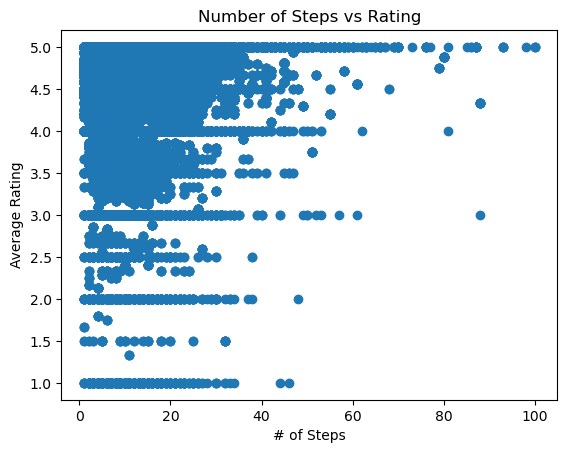

In [11]:
plt.scatter(total_df['n_steps'], total_df['avg_rating'])
plt.title('Number of Steps vs Rating')
plt.xlabel('# of Steps')
plt.ylabel("Average Rating")
plt.show()

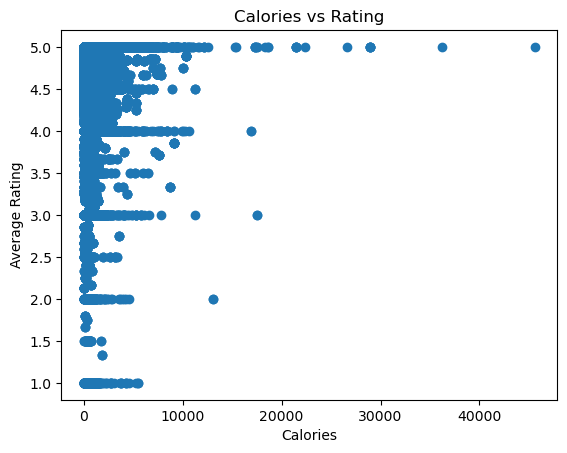

In [12]:
plt.scatter(total_df['calories_(#)'], total_df['avg_rating'])
plt.title('Calories vs Rating')
plt.xlabel('Calories')
plt.ylabel("Average Rating")
plt.show()

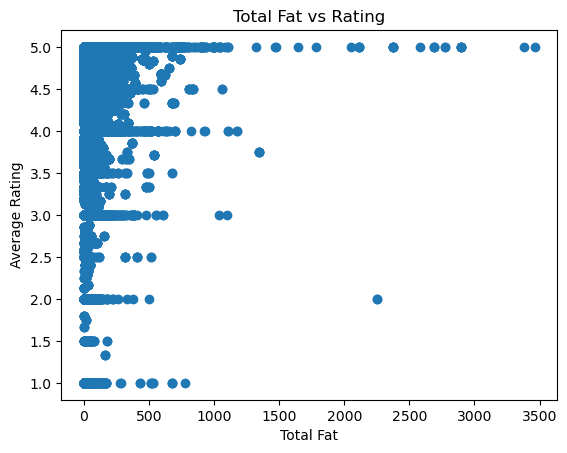

In [13]:
plt.scatter(total_df['total_fat_(PDV)'], total_df['avg_rating'])
plt.title('Total Fat vs Rating')
plt.xlabel('Total Fat')
plt.ylabel("Average Rating")
plt.show()

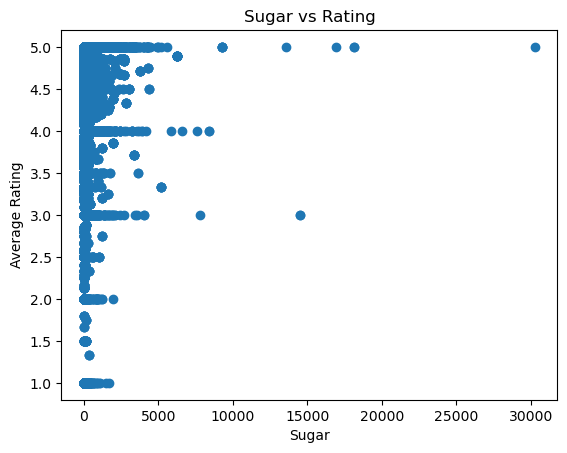

In [14]:
plt.scatter(total_df['sugar_(PDV)'], total_df['avg_rating'])
plt.title('Sugar vs Rating')
plt.xlabel('Sugar')
plt.ylabel("Average Rating")
plt.show()

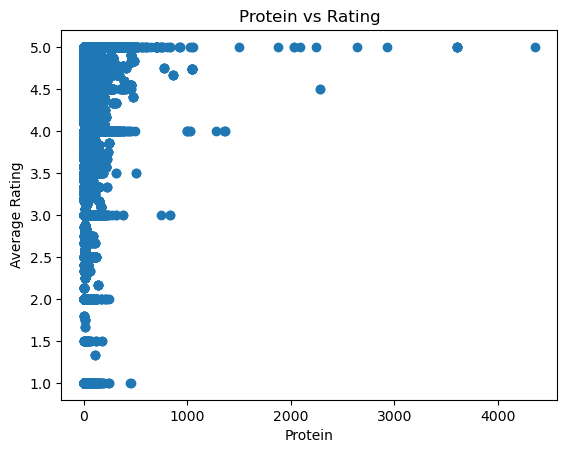

In [15]:
plt.scatter(total_df['protein_(PDV)'], total_df['avg_rating'])
plt.title('Protein vs Rating')
plt.xlabel('Protein')
plt.ylabel("Average Rating")
plt.show()

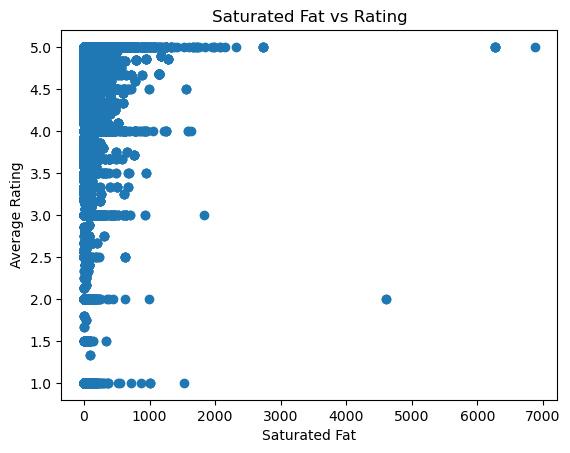

In [16]:
plt.scatter(total_df['saturated_fat_(PDV)'], total_df['avg_rating'])
plt.title('Saturated Fat vs Rating')
plt.xlabel('Saturated Fat')
plt.ylabel("Average Rating")
plt.show()

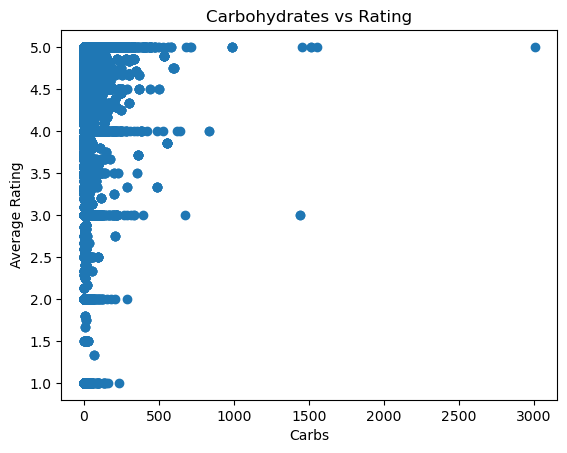

In [17]:
plt.scatter(total_df['carbohydrates_(PDV)'], total_df['avg_rating'])
plt.title('Carbohydrates vs Rating')
plt.xlabel('Carbs')
plt.ylabel("Average Rating")
plt.show()

In [18]:
df2 = total_df.groupby('n_ingredients')['avg_rating'].mean()


In [19]:
df2

n_ingredients
1     4.821754
2     4.737340
3     4.719269
4     4.695410
5     4.705671
6     4.676338
7     4.665188
8     4.656680
9     4.661149
10    4.659475
11    4.678269
12    4.674178
13    4.686485
14    4.656883
15    4.679203
16    4.674248
17    4.669180
18    4.721667
19    4.684889
20    4.684847
21    4.690574
22    4.833282
23    4.804059
24    4.737853
25    4.657407
26    4.827689
27    4.652381
28    4.838435
29    4.930876
30    4.781250
31    5.000000
32    5.000000
33    5.000000
37    5.000000
Name: avg_rating, dtype: float64

In [20]:
fig = px.scatter(df2)
fig.update_layout(title='n_ingredients vs avg_rating', xaxis_title='n_ingredients', yaxis_title='avg_rating')

In [21]:
df3 = total_df.groupby('avg_rating')['calories_(#)'].mean()
fig = px.scatter(df3)
fig.update_layout(title='avg_rating vs calories_(#)', xaxis_title='avg_rating', yaxis_title='calories_(#)')

##### Interesting Aggregates

In [22]:
protein_rating = total_df.groupby('avg_rating')['protein_(PDV)'].agg(['mean', 'median', 'min', 'max'])
protein_rating.columns = ['protein_mean', 'protein_median', 'protein_min', 'protein_max']
protein_rating

,protein_mean,protein_median,protein_min,protein_max
avg_rating,,,,
1.000000,29.500717,12.0,0.0,459.0
1.333333,111.000000,111.0,111.0,111.0
1.500000,33.688889,15.0,0.0,173.0
1.666667,9.000000,9.0,9.0,9.0
1.750000,9.000000,9.0,9.0,9.0
...,...,...,...,...
4.973684,25.000000,25.0,25.0,25.0
4.977273,36.000000,36.0,36.0,36.0
4.981132,21.000000,21.0,21.0,21.0


In [23]:
fig = px.line(total_df.groupby('n_ingredients')['total_fat_(PDV)'].mean())
fig.update_layout(title='n_ingredients vs total_fat_(PDV)', xaxis_title='n_ingredients', yaxis_title='total_fat_(PDV)')

In [24]:
total_df_temp = total_df.copy()

In [25]:
bins = [0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5]
labels = ['0-0.5', '0.5-1', '1-1.5', '1.5-2', '2-2.5', '2.5-3', '3-3.5', '3.5-4', '4-4.5', '4.5-5']
total_df_temp['avg_rating_bins'] = pd.cut(total_df_temp['avg_rating'], bins=bins, labels=labels, right=False)

In [26]:
protein_rating_temp = total_df_temp.groupby('avg_rating_bins')['protein_(PDV)'].agg(['mean', 'median', 'min', 'max'])
protein_rating_temp.columns = ['protein_mean', 'protein_median', 'protein_min', 'protein_max']
protein_rating_temp

C:\Users\johns\AppData\Local\Temp\ipykernel_49428\856503005.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,protein_mean,protein_median,protein_min,protein_max
avg_rating_bins,,,,
0-0.5,NaN,NaN,NaN,NaN
0.5-1,NaN,NaN,NaN,NaN
1-1.5,29.850000,13.0,0.0,459.0
1.5-2,27.741379,12.0,0.0,173.0
2-2.5,29.293567,15.0,0.0,246.0
2.5-3,27.335260,12.0,0.0,120.0
3-3.5,33.131627,17.0,0.0,835.0
3.5-4,33.550271,19.0,0.0,505.0
4-4.5,35.674578,20.0,0.0,1361.0


## Step 3: Assessment of Missingness

To check if there's any column with missing values

In [27]:
missing_values_columns = total_df_temp.columns[total_df_temp.isna().any()].tolist()

In [28]:
missing_values_columns

['rating', 'review', 'avg_rating', 'avg_rating_bins']

In [29]:
total_df_temp.columns

Index(['minutes', 'tags', 'n_steps', 'n_ingredients', 'rating', 'review',
       'avg_rating', 'calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)',
       'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)',
       'carbohydrates_(PDV)', 'avg_rating_bins'],
      dtype='object')

Permutation Test setup

In [30]:
total_df_temp['review_missing'] = total_df_temp['review'].isna()
total_df_temp.head(5)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV),avg_rating_bins,review_missing
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0,4-4.5,False
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0,NaN,False
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False
3,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,I made this for my son's first birthday party ...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False
4,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,Loved this. Be sure to completely thaw the br...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False


#### Review vs Calories

In [31]:
n_repetitions = 500
shuffled = total_df_temp.copy()

diff_means = []
for _ in range(n_repetitions):
    
    # Shuffling the values, while keeping the group labels in place.
    shuffled['calories_(#)'] = np.random.permutation(shuffled['calories_(#)'])
    
    # Computing and storing the absolute difference in means.
    diff_mean = shuffled.groupby('review_missing')['calories_(#)'].mean().diff().abs().iloc[-1]
    diff_means.append(diff_mean)

In [32]:
observed_diff = total_df_temp.groupby('review_missing')['calories_(#)'].mean().diff().abs().iloc[-1]
fig = px.histogram(pd.DataFrame(diff_means), x=0, nbins=50, histnorm='probability', 
                   title='Empirical Distribution of the Absolute Difference in Means')
fig.add_vline(x=observed_diff, line_color='red', line_width=1, opacity=1)
fig.add_annotation(text=f'<span style="color:red">Observed Absolute Difference in Means = {round(observed_diff, 2)}</span>',
                   x=2 * observed_diff, showarrow=False, y=0.07)

In [33]:
np.mean(np.array(diff_means) >= observed_diff)

0.004

In [34]:
import plotly.figure_factory as ff
def create_kde_plotly(df, group_col, group1, group2, vals_col, title=''):
    fig = ff.create_distplot(
        hist_data=[df.loc[df[group_col] == group1, vals_col], df.loc[df[group_col] == group2, vals_col]],
        group_labels=[group1, group2],
        show_rug=False, show_hist=False
    )
    return fig.update_layout(title=title)
create_kde_plotly(total_df_temp, 'review_missing', True, False, 'calories_(#)', f'Calories by Missingness of reviews')

Hence, it does depend.

#### Review vs Minutes

In [35]:
n_repetitions = 500
shuffled = total_df_temp.copy()

diff_means = []
for _ in range(n_repetitions):
    
    # Shuffling the values, while keeping the group labels in place.
    shuffled['minutes'] = np.random.permutation(shuffled['minutes'])
    
    # Computing and storing the absolute difference in means.
    diff_mean = shuffled.groupby('review_missing')['minutes'].mean().diff().abs().iloc[-1]
    diff_means.append(diff_mean)
observed_diff = total_df_temp.groupby('review_missing')['minutes'].mean().diff().abs().iloc[-1]
fig = px.histogram(pd.DataFrame(diff_means), x=0, nbins=50, histnorm='probability', 
                   title='Empirical Distribution of the Absolute Difference in Means')
fig.add_vline(x=observed_diff, line_color='red', line_width=1, opacity=1)
fig.add_annotation(text=f'<span style="color:red">Observed Absolute Difference in Means = {round(observed_diff, 2)}</span>',
                   x=2 * observed_diff, showarrow=False, y=0.07)

In [36]:
np.mean(np.array(diff_means) >= observed_diff)

0.666

In [37]:
create_kde_plotly(total_df_temp, 'review_missing', True, False, 'minutes', f'Minutes by Missingness of reviews')

Hence, it does not depend

## SOME OTHER STUFF

In [38]:
# pairplot = sns.pairplot(total_df_temp)
# plt.show()

In [39]:
total_df_temp.head(3)

,minutes,tags,n_steps,n_ingredients,rating,review,avg_rating,calories_(#),total_fat_(PDV),sugar_(PDV),sodium_(PDV),protein_(PDV),saturated_fat_(PDV),carbohydrates_(PDV),avg_rating_bins,review_missing
0,40,"[60-minutes-or-less, time-to-make, course, mai...",10,9,4.0,"These were pretty good, but took forever to ba...",4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0,4-4.5,False
1,45,"[60-minutes-or-less, time-to-make, cuisine, pr...",12,11,5.0,Originally I was gonna cut the recipe in half ...,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0,NaN,False
2,40,"[60-minutes-or-less, time-to-make, course, mai...",6,9,5.0,This was one of the best broccoli casseroles t...,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0,NaN,False


In [40]:
# heatmap = sns.heatmap(total_df_temp.corr(), annot=True, center=0, fmt=".1g")
# heatmap

## Step 4: Hypothesis Testing

Question: 

NULL: 

Alternate:

stat: 

In [41]:
total_df_temp.columns

Index(['minutes', 'tags', 'n_steps', 'n_ingredients', 'rating', 'review',
       'avg_rating', 'calories_(#)', 'total_fat_(PDV)', 'sugar_(PDV)',
       'sodium_(PDV)', 'protein_(PDV)', 'saturated_fat_(PDV)',
       'carbohydrates_(PDV)', 'avg_rating_bins', 'review_missing'],
      dtype='object')

In [42]:
hypo_df = total_df_temp[['n_steps', 'protein_(PDV)', 'avg_rating']]
hypo_df

,n_steps,protein_(PDV),avg_rating
0,10,3.0,4.0
1,12,13.0,5.0
2,6,22.0,5.0
3,6,22.0,5.0
4,6,22.0,5.0
...,...,...,...
234424,7,6.0,5.0
234425,9,7.0,1.0
234426,5,4.0,3.0
234427,5,4.0,3.0


In [43]:
def categorize_work(n_steps):
    if n_steps <= 10:
        return 'Little Work'
    elif 10 <= n_steps <= 25:
        return 'Significant Work'
    else:
        return 'Extreme Work'
    
hypo_df['work_category'] = hypo_df['n_steps'].apply(categorize_work)
hypo_df

,n_steps,protein_(PDV),avg_rating,work_category
0,10,3.0,4.0,Little Work
1,12,13.0,5.0,Significant Work
2,6,22.0,5.0,Little Work
3,6,22.0,5.0,Little Work
4,6,22.0,5.0,Little Work
...,...,...,...,...
234424,7,6.0,5.0,Little Work
234425,9,7.0,1.0,Little Work
234426,5,4.0,3.0,Little Work
234427,5,4.0,3.0,Little Work


In [44]:
hypo_df['work_category'].value_counts()

work_category
Little Work         147750
Significant Work     80686
Extreme Work          5993
Name: count, dtype: int64

# Statistical Analysis: Correlation and regression analysis to explore relationships between variables.


# Correlation Analysis

minutes                  int64
n_steps                  int64
n_ingredients            int64
rating                 float64
avg_rating             float64
calories_(#)           float64
total_fat_(PDV)        float64
sugar_(PDV)            float64
sodium_(PDV)           float64
protein_(PDV)          float64
saturated_fat_(PDV)    float64
carbohydrates_(PDV)    float64
dtype: object


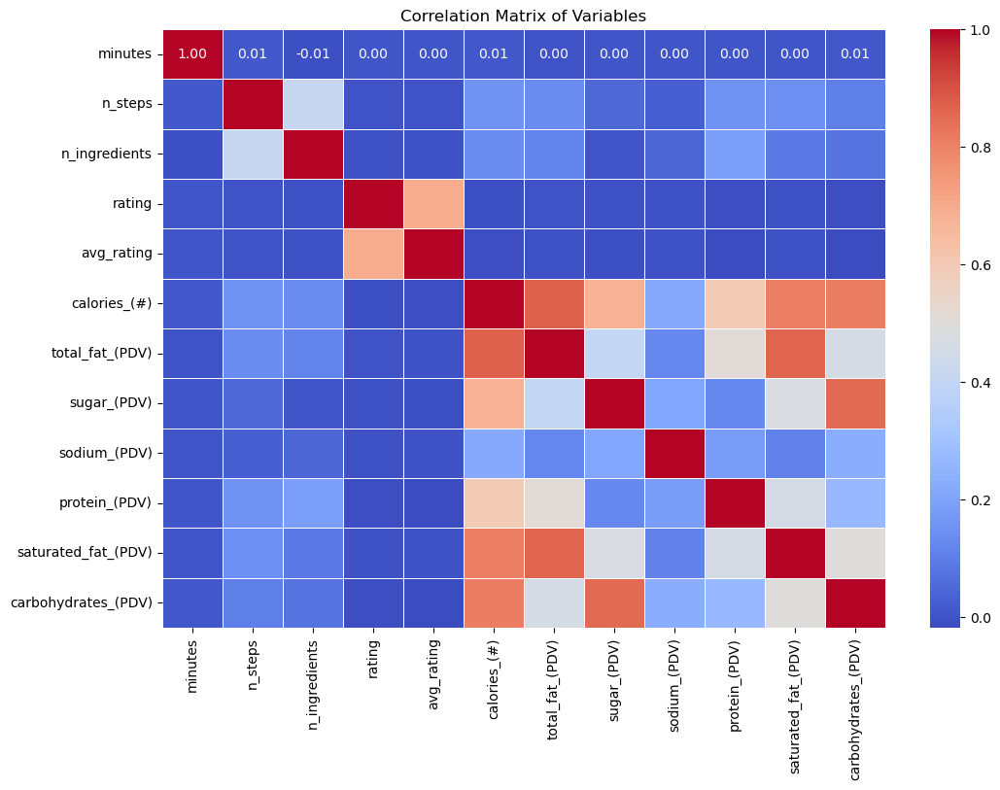

In [45]:
# Drop non-numeric columns
total_df_numeric = total_df.drop(columns=['tags', 'review'])

# Check if any column still needs conversion or handling
print(total_df_numeric.dtypes)

# Compute the correlation matrix
correlation_matrix = total_df_numeric.corr()

# Visualize the correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Variables')
plt.show()





### Regression Analysis

In [46]:
import statsmodels.api as sm

# Choose a dependent variable and independent variables
X = total_df_numeric[['n_steps', 'n_ingredients', 'calories_(#)', 'protein_(PDV)']]  # Independent variables
Y = total_df_numeric['avg_rating']  # Dependent variable

# Add a constant to the model (the intercept)
X = sm.add_constant(X)

# Create a model
model = sm.OLS(Y, X, missing='drop')  # 'drop' automatically drops all missing values

# Fit the model
results = model.fit()

# Print the summary of the regression
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:             avg_rating   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     16.93
Date:                Sun, 09 Jun 2024   Prob (F-statistic):           6.86e-14
Time:                        22:02:10   Log-Likelihood:            -1.6706e+05
No. Observations:              231652   AIC:                         3.341e+05
Df Residuals:                  231647   BIC:                         3.342e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const             4.6853      0.003   1692.921

### Exploring Non-linear Relationships

In [47]:
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.impute import SimpleImputer
import statsmodels.api as sm

# Impute missing values
imputer = SimpleImputer(strategy='mean')
total_df_numeric[['n_steps', 'n_ingredients', 'avg_rating']] = imputer.fit_transform(total_df_numeric[['n_steps', 'n_ingredients', 'avg_rating']])

# Scale features before polynomial transformation
scaler = StandardScaler()
scaled_features = scaler.fit_transform(total_df_numeric[['n_steps', 'n_ingredients']])

# Create polynomial features
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(scaled_features)

# Fit the model using polynomial features
model = sm.OLS(total_df_numeric['avg_rating'], sm.add_constant(X_poly))
results_poly = model.fit()

# Print the summary
print(results_poly.summary())




                            OLS Regression Results                            
Dep. Variable:             avg_rating   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     55.90
Date:                Sun, 09 Jun 2024   Prob (F-statistic):           2.77e-58
Time:                        22:02:11   Log-Likelihood:            -1.6756e+05
No. Observations:              234429   AIC:                         3.351e+05
Df Residuals:                  234423   BIC:                         3.352e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.6649      0.001   3736.486      0.0

### Addressing Multicollinearity

In [48]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming X is the set of independent variables
VIF_df = pd.DataFrame()
VIF_df["feature"] = X.columns
VIF_df["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(VIF_df)


         feature       VIF
0          const  7.156657
1        n_steps  1.215869
2  n_ingredients  1.224585
3   calories_(#)  1.553833
4  protein_(PDV)  1.574897


# Statistical Analysis of Recipe Data

## Data Preparation and Cleaning

In this initial phase, we loaded and merged two key datasets: recipes and user interactions. During the data cleaning process, we identified and transformed non-numeric columns such as `tags` and `reviews` to ensure our dataset was suitable for numerical analysis. Non-essential or list-based columns were either transformed (e.g., by calculating the length of lists) or excluded from our analyses to create a clean dataset, `total_df_numeric`, primed for further statistical exploration.

## Correlation Analysis

We computed a correlation matrix to explore the relationships between various numerical variables. These included:
- Cooking time (`minutes`)
- Number of steps (`n_steps`)
- Nutritional content (e.g., `calories`, `protein`)
- User ratings (`avg_rating`)

This step helped us understand how different variables interrelated and laid the groundwork for more complex analyses.

## Regression Analysis

Using linear regression, we examined how well certain variables could predict the average user ratings. We applied both simple and multiple regression models to assess the impact of individual predictors and combinations thereof on user ratings. This analysis provided quantitative insights into which factors most significantly influence user satisfaction.

## Regression Diagnostics

Post-regression, we conducted several diagnostic tests to validate the assumptions of our linear regression models:

- **Residuals vs. Fitted Plot**: We checked for homoscedasticity to ensure that the residuals had constant variance across fitted values.
- **Normal Q-Q Plot**: We assessed the normality of residuals.
- **Scale-Location Plot**: We further examined homoscedasticity.
- **Influence Plot**: We identified influential points that could potentially skew our model predictions.

These diagnostics were crucial for confirming the reliability and robustness of our regression findings.

## Exploring Non-linear Relationships and Multicollinearity

We explored potential non-linear relationships by incorporating polynomial terms in our regression models, allowing us to capture more complex interactions between variables. Additionally, we examined multicollinearity using the Variance Inflation Factor (VIF) to ensure that high intercorrelations among predictors did not adversely affect our regression results.

## Handling Outliers and Influential Points

To enhance the integrity of our models, we removed influential points identified via diagnostics like Cook's distance. This refinement was pivotal in ensuring that our models accurately represented the broader trends without being unduly influenced by outliers.

## Conclusion

Our comprehensive statistical analysis has provided profound insights into the factors influencing user ratings of recipes. By rigorously checking assumptions and refining our models, we have ensured that the insights we derived are well-supported by the data. This not only helps in understanding what drives user preferences but also guides recipe enhancements and content creation within the culinary community.


# Model Section

### Forward Selection

In [49]:
total_df_numeric = total_df_numeric.rename(columns={'calories_(#)': 'calories', 'total_fat_(PDV)': 'total_fat', 'sugar_(PDV)':'sugar', 'sodium_(PDV)':'sodium', 'protein_(PDV)':'protein', 'saturated_fat_(PDV)':'saturated_fat', 'carbohydrates_(PDV)':'carbohydrates'})

In [50]:
total_df_numeric_selection = total_df_numeric.drop(columns=['rating'])
total_df_numeric_selection

,minutes,n_steps,n_ingredients,avg_rating,calories,total_fat,sugar,sodium,protein,saturated_fat,carbohydrates
0,40,10.0,9.0,4.0,138.4,10.0,50.0,3.0,3.0,19.0,6.0
1,45,12.0,11.0,5.0,595.1,46.0,211.0,22.0,13.0,51.0,26.0
2,40,6.0,9.0,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
3,40,6.0,9.0,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
4,40,6.0,9.0,5.0,194.8,20.0,6.0,32.0,22.0,36.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...
234424,40,7.0,8.0,5.0,59.2,6.0,2.0,3.0,6.0,5.0,0.0
234425,29,9.0,10.0,1.0,188.0,11.0,57.0,11.0,7.0,21.0,9.0
234426,20,5.0,7.0,3.0,174.9,14.0,33.0,4.0,4.0,11.0,6.0
234427,20,5.0,7.0,3.0,174.9,14.0,33.0,4.0,4.0,11.0,6.0


In [51]:
criterion = lambda formula, df: smf.ols(formula, data=df).fit().bic

In [52]:
def add(df, selected_columns, columns, criterion, response='y'):
    best_criterion = np.inf
    best_column = None
    for column in columns - selected_columns:
        new_columns = selected_columns.union({column})
        formula = f'{response} ~ {" + ".join(new_columns)}'
        current_criterion = criterion(formula, df)
        if current_criterion < best_criterion:
            best_criterion = current_criterion
            best_column = column
    return selected_columns.union({best_column}), best_criterion

In [53]:
def forward(df, criterion, response='y'):
    selected_columns = set()
    columns = set(df.columns.drop(response))
    best_criterion = np.inf
    while len(selected_columns) < len(columns):
        potential_columns, current_criterion = add(df, selected_columns, columns, criterion, response)
        if current_criterion > best_criterion:
            break
        else:
            selected_columns = potential_columns
            best_criterion = current_criterion
            print(f'Criterion: {best_criterion}')
    return selected_columns

In [54]:
forward_vars = forward(total_df_numeric_selection, criterion, response='avg_rating')
print(f'forward_vars: {forward_vars}')

Criterion: 335336.07919949613
Criterion: 335318.483981097
Criterion: 335287.0700886107
forward_vars: {'calories', 'carbohydrates', 'protein'}


In [55]:
forward_model = smf.ols('avg_rating ~ calories + protein + carbohydrates', data=total_df_numeric).fit()
forward_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             avg_rating   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     51.01
Date:                Sun, 09 Jun 2024   Prob (F-statistic):           6.03e-33
Time:                        22:02:14   Log-Likelihood:            -1.6762e+05
No. Observations:              234429   AIC:                         3.352e+05
Df Residuals:                  234425   BIC:                         3.353e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         4.6832      0.001   3591.867      0.000       4.681       4.686
calories       2.665e-05   4.03e-06      6.617      0.000    1.88e-05    3.45e-05
protein          -0.0003   2.98e-05     -8.489      0.000      -0.000      -0.000
carbohydrates    -0.0007   7.63e-05     -9.395      0.000      -0.001      -0.001
==============================================================================
Omnibus:                   150424.253   Durbin-Watson:                   1.138
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          2010804.091
Skew:                          -2.941   Prob(JB):                         0.00
Kurtosis:                      16.087   Cond. No.                         919.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Backward Selection

In [56]:
def remove(df, selected_columns, criterion, response='y'):
    worst_criterion = np.inf
    worst_column = None
    for column in selected_columns:
        new_columns = selected_columns - {column}
        formula = f'{response} ~ {" + ".join(new_columns)}'
        current_criterion = criterion(formula, df)
        if current_criterion < worst_criterion:
            worst_criterion = current_criterion
            worst_column = column
    return worst_column, worst_criterion

In [57]:
def backward(df, criterion, response='y'):
    selected_columns = set(df.columns.drop(response))
    columns = set(df.columns.drop(response))
    best_criterion = np.inf
    while len(selected_columns) > 0:
        potential_column, current_criterion = remove(df, selected_columns, criterion, response)
        if current_criterion > best_criterion:
            break
        else:
            selected_columns = selected_columns - {potential_column}
            best_criterion = current_criterion
            print(f'Criterion: {best_criterion}')
    return selected_columns

In [58]:
backward_vars = backward(total_df_numeric_selection, criterion, response='avg_rating')
print(f'backward_vars: {backward_vars}')

Criterion: 335337.2096132544
Criterion: 335325.7779324488
Criterion: 335314.95508277067
Criterion: 335303.3296893934
Criterion: 335293.43676626007
Criterion: 335288.5409196481
Criterion: 335287.0700886107
backward_vars: {'calories', 'carbohydrates', 'protein'}


In [59]:
forward_vars == backward_vars

True

### Mixed Selection

In [60]:
r2_adj_criterion = lambda formula, df: -smf.ols(formula, data=df).fit().rsquared_adj
bic_criterion = lambda formula, df: smf.ols(formula, data=df).fit().bic
aic_criterion = lambda formula, df: smf.ols(formula, data=df).fit().aic

forward_vars_aic = forward(total_df_numeric_selection, aic_criterion, response='avg_rating')
forward_vars_bic = forward(total_df_numeric_selection, bic_criterion, response='avg_rating')
forward_vars_r2 = forward(total_df_numeric_selection, r2_adj_criterion, response='avg_rating')

print(f'forward_vars_aic: {forward_vars_aic}')
print(f'forward_vars_bic: {forward_vars_bic}')
print(f'forward_vars_r2: {forward_vars_r2}')

Criterion: 335315.3493833978
Criterion: 335287.3892569495
Criterion: 335245.610456414
Criterion: 335236.7163794022
Criterion: 335231.24731796514
Criterion: 335230.7753330493
Criterion: 335336.07919949613
Criterion: 335318.483981097
Criterion: 335287.0700886107
Criterion: -0.00033365936196783075
Criterion: -0.00045714521419215615
Criterion: -0.0006395259279988741
Criterion: -0.0006817029694778931
Criterion: -0.0007092786483334779
Criterion: -0.0007155530791521647
forward_vars_aic: {'calories', 'carbohydrates', 'protein', 'total_fat', 'sugar', 'saturated_fat'}
forward_vars_bic: {'calories', 'carbohydrates', 'protein'}
forward_vars_r2: {'calories', 'carbohydrates', 'protein', 'total_fat', 'sugar', 'saturated_fat'}


In [61]:
forward_formula = f'avg_rating ~ {" + ".join(forward_vars_bic)}'
forward_model = smf.ols(forward_formula, data=total_df_numeric_selection).fit()
print(forward_model.summary())

                            OLS Regression Results                            
Dep. Variable:             avg_rating   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     51.01
Date:                Sun, 09 Jun 2024   Prob (F-statistic):           6.03e-33
Time:                        22:02:37   Log-Likelihood:            -1.6762e+05
No. Observations:              234429   AIC:                         3.352e+05
Df Residuals:                  234425   BIC:                         3.353e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         4.6832      0.001   3591.867

In [62]:
forward_formula_aic = f'avg_rating ~ {" + ".join(forward_vars_aic)}'
forward_model_aic = smf.ols(forward_formula_aic, data=total_df_numeric_selection).fit()
print(forward_model_aic.summary())

                            OLS Regression Results                            
Dep. Variable:             avg_rating   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     28.98
Date:                Sun, 09 Jun 2024   Prob (F-statistic):           7.02e-35
Time:                        22:02:38   Log-Likelihood:            -1.6761e+05
No. Observations:              234429   AIC:                         3.352e+05
Df Residuals:                  234422   BIC:                         3.353e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         4.6831      0.001   3492.860

In [63]:
forward_formula_r2 = f'avg_rating ~ {" + ".join(forward_vars_r2)}'
forward_model_r2 = smf.ols(forward_formula_r2, data=total_df_numeric_selection).fit()
print(forward_model_r2.summary())

                            OLS Regression Results                            
Dep. Variable:             avg_rating   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     28.98
Date:                Sun, 09 Jun 2024   Prob (F-statistic):           7.02e-35
Time:                        22:02:38   Log-Likelihood:            -1.6761e+05
No. Observations:              234429   AIC:                         3.352e+05
Df Residuals:                  234422   BIC:                         3.353e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         4.6831      0.001   3492.860

# Conclusion

## Overview of Statistical Analysis

Our comprehensive analysis aimed to discern key factors influencing user ratings of recipes. We employed correlation analysis, multiple linear regression, and polynomial regression models to scrutinize the relationships between nutritional content, recipe complexity, and user ratings within a large dataset.

## Key Findings

### Correlation Analysis

- The correlation matrix indicated generally weak linear relationships between most nutritional factors and user ratings. This suggests that no single nutritional attribute significantly drives user ratings, pointing instead to a multifactorial influence on user preferences.

### Regression Analysis

- The regression models demonstrated minimal variance explanation in average ratings (R-squared values around 0.001), signifying weak predictive power of the included variables.
- Notably, calories showed a slight negative impact, whereas protein content had a marginal positive influence on ratings, though both effects were small.

### Polynomial Regression Analysis

- Incorporating polynomial terms did not substantially increase the explanatory power of our models, implying that non-linear relationships between the studied variables and ratings are also weak.

### Diagnostics and Multicollinearity

- Diagnostic tests revealed large condition numbers, suggesting sensitivity to data fluctuations despite VIF scores indicating minimal multicollinearity. This highlights the complexity and potential instability in our models.

## Implications for Recipe Management

The weak associations observed suggest that factors not captured in our dataset—possibly qualitative attributes like taste preferences, presentation, or recipe descriptions—play significant roles in influencing ratings.

## Recommendations for Further Research

- **Inclusion of Qualitative Data**: Future research should incorporate qualitative aspects, such as user comments or sentiment analysis, to gain deeper insights into what influences user ratings.
- **Advanced Modeling Techniques**: Employing sophisticated machine learning techniques might better capture the complex patterns affecting user ratings.
- **User-Specific Analysis**: Segmenting users by preference could unveil more detailed trends and enhance recommendation personalization.

## Concluding Statement

Our investigation highlights the complexity of taste and preference in recipe ratings. While we did not identify strong predictors within our examined variables, this outcome steers future research toward incorporating broader data types and more advanced analytical methods to uncover the diverse factors impacting user ratings in the culinary domain.
